In [1]:
import tensorflow as tf
from keras.backend.tensorflow_backend import set_session
gpu_options = tf.GPUOptions(allow_growth=True)
config = tf.ConfigProto(gpu_options=gpu_options)   
sess = tf.Session(config=config)
set_session(sess)

/usr/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: compiletime version 3.5 of module 'tensorflow.python.framework.fast_tensor_util' does not match runtime version 3.6
  return f(*args, **kwds)
/home/ekashin/.local/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [2]:
import numpy as np
from keras.applications import vgg16
from keras import backend as K
from keras.utils import plot_model
import scipy.misc
import cv2
from keras.preprocessing import image
from keras.applications.resnet50 import preprocess_input, decode_predictions
import numpy as np
from glob import glob

import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
model = vgg16.VGG16(weights='imagenet', include_top=True)

In [4]:
img_path = 'data/gt86.jpg'

img = image.load_img(img_path, target_size=(224, 224))
img = image.img_to_array(img)
img = img.astype(int)
preprocessed_img = preprocess_input(img.astype(np.float))

### Проверим, что предсказывает модель для всей картинки

In [6]:
pred = model.predict(np.expand_dims(preprocessed_img, 0))
decoded_pred = decode_predictions(pred) # человекочитаемый вид предсказаний

In [7]:
decoded_pred

[[('n04037443', 'racer', 0.2349127),
  ('n04285008', 'sports_car', 0.12668541),
  ('n03930630', 'pickup', 0.110809654),
  ('n02974003', 'car_wheel', 0.08581034),
  ('n03100240', 'convertible', 0.08177724)]]

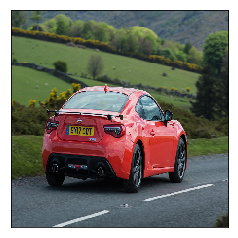

In [8]:
plt.imshow(img)
plt.xticks([])
plt.yticks([]);

---

In [9]:
width = 224 
size = 896 

In [10]:
big_img = image.load_img(img_path, target_size=(size, size))
big_img = image.img_to_array(big_img)
big_img = big_img.astype(int)

In [11]:
big_img.shape

(896, 896, 3)

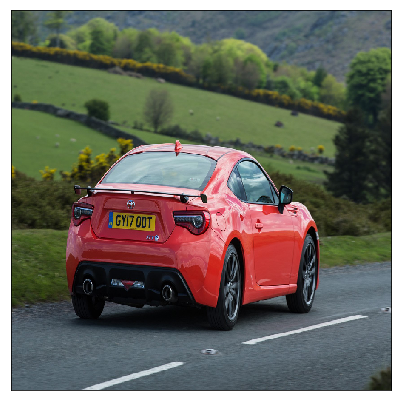

In [12]:
plt.figure(figsize=(7, 7))
plt.imshow(big_img)
plt.xticks([])
plt.yticks([]);

In [13]:
sizes = [width, int(width * 1.5), int(width * 2.5)] # размеры прямоугольников, для которых будем пробовать модель

In [14]:
sizes

[224, 336, 560]

### Какого размера относительно изображения квадраты?

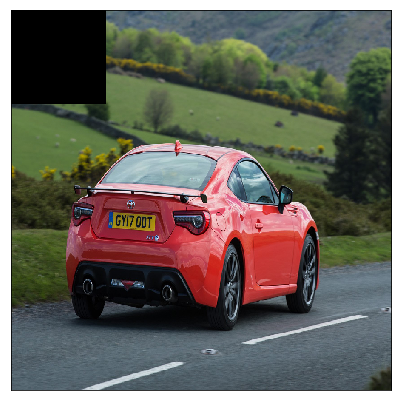

In [15]:
big_img1 = big_img.copy()
big_img1[:sizes[0], :sizes[0], :] = 0
plt.figure(figsize=(7, 7))
plt.imshow(big_img1)
plt.xticks([])
plt.yticks([]);

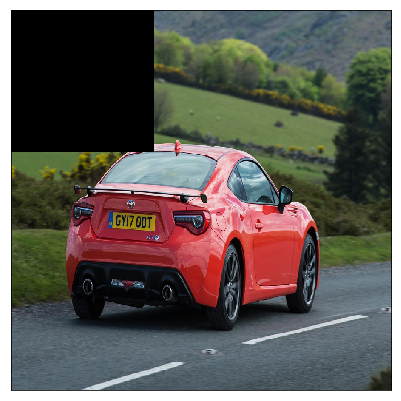

In [16]:
big_img1 = big_img.copy()
big_img1[:sizes[1], :sizes[1], :] = 0
plt.figure(figsize=(7, 7))
plt.imshow(big_img1)
plt.xticks([])
plt.yticks([]);

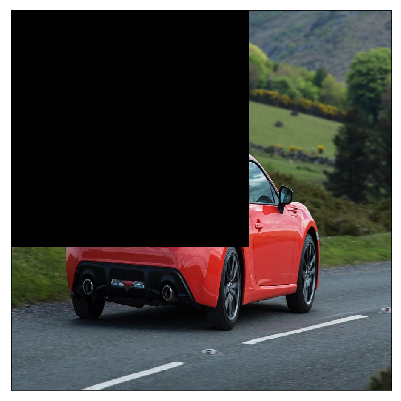

In [17]:
big_img1 = big_img.copy()
big_img1[:sizes[2], :sizes[2], :] = 0
plt.figure(figsize=(7, 7))
plt.imshow(big_img1)
plt.xticks([])
plt.yticks([]);

In [18]:
step = width // 2 # размер шага, с которым будет двигаться квадрат

## Нарезка кропов

In [19]:
crops = []
coords = []
for s in sizes:
    print(s)
    for x in range(0, size - s, step):
        for y in range(0, size - s, step):
            crop = big_img[y: y + s, x: x + s, :]
            crops.append(crop.copy())
            coords.append((y, y + s, x, x + s))

224
336
560


In [20]:
len(crops)

70

### Ресайз до размеров входа VGG

In [21]:
resized_cr = []
for cr in crops:
    cr = cv2.resize(cr, (224, 224), interpolation=cv2.INTER_NEAREST)
    resized_cr.append(cr)

resized_cr = np.stack(resized_cr)

In [22]:
predictions = model.predict(resized_cr)
decoded_predictions = decode_predictions(predictions)

### Что предсказывается для каждого кропа

/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


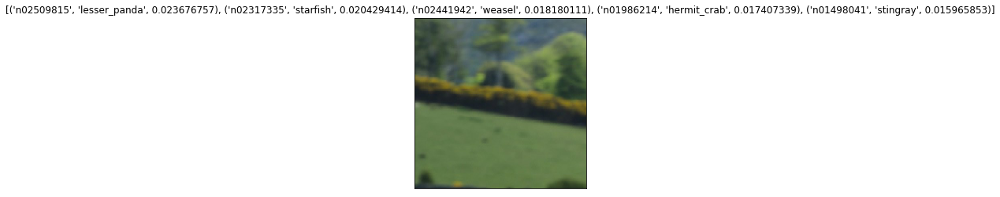

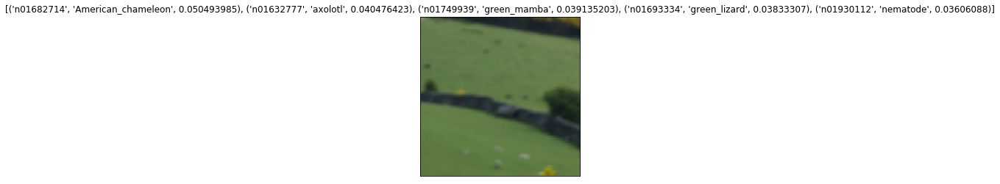

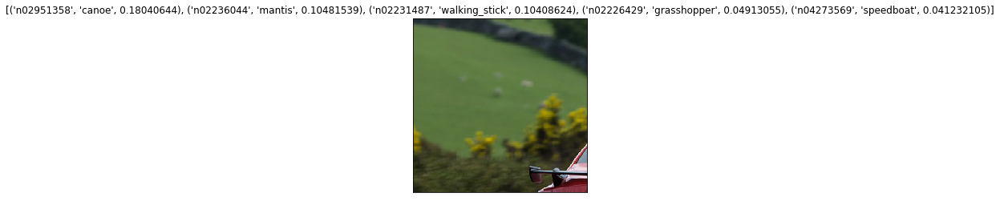

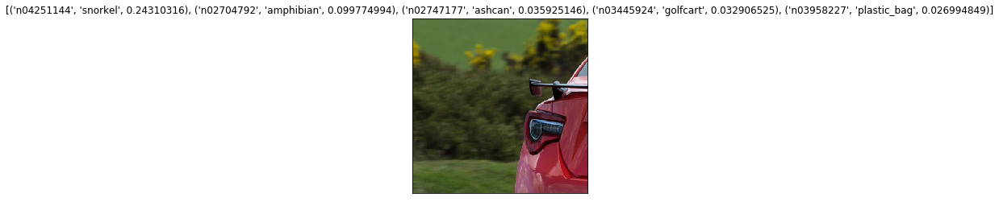

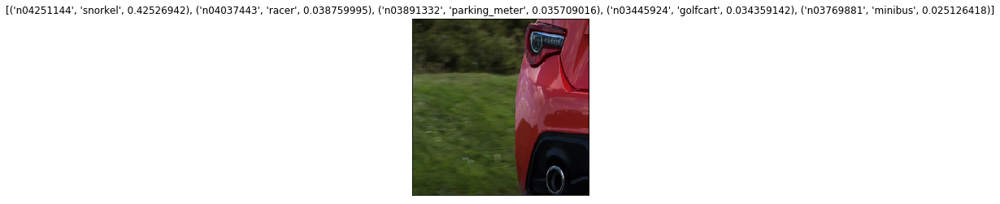

...

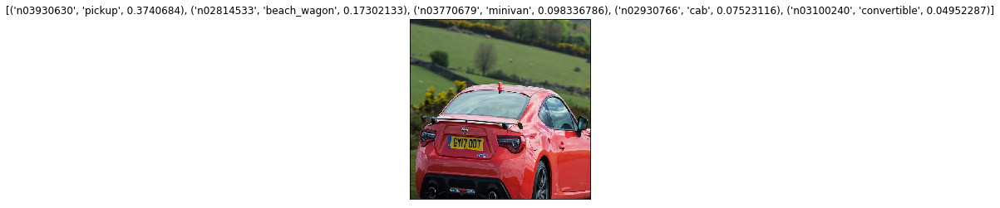

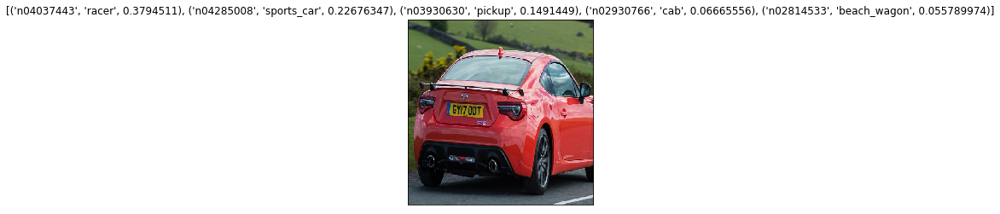

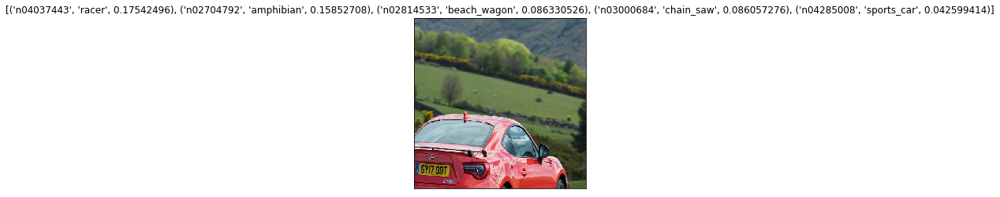

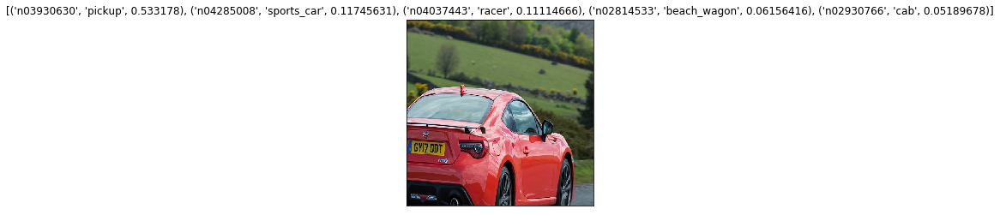

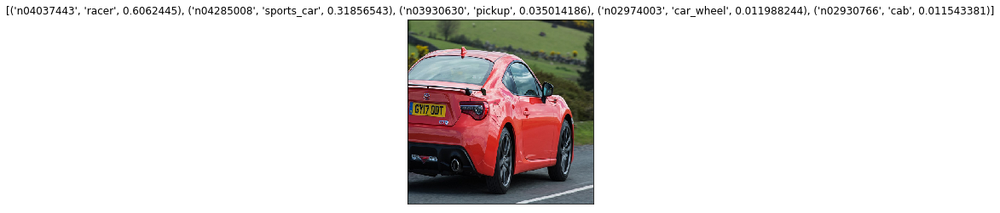

In [23]:
for cr, pr in zip(crops, decoded_predictions):
    plt.figure()
    plt.imshow(cr)
    plt.title(pr)
    plt.xticks([])
    plt.yticks([]);

In [26]:
top_n = 5

top_preds = predictions.max(axis=1).argsort()[-top_n:]
top_preds_classes = predictions.argmax(axis=1)[top_preds]
top_preds_classes_names = [classes[c] for c in top_preds_classes]

In [27]:
big_img.shape

(896, 896, 3)

In [30]:
colors = [(255, 0, 0), (0, 255, 0), (0, 0, 255), (255, 255, 255), (0, 0, 0)]

img_rects = big_img.astype(np.uint8)
for i, top in enumerate(top_preds):
    c = coords[top]
    p1, p2 = (c[2], c[0]), (c[3], c[1])
    img_rects = cv2.rectangle(img_rects, p1, p2, colors[i], 4)

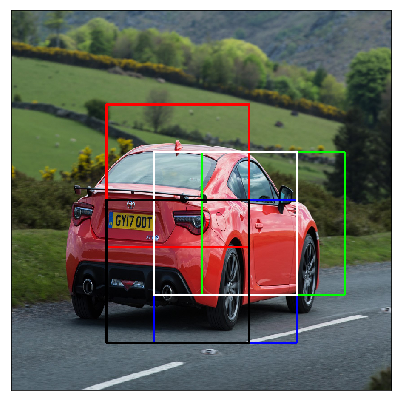

In [31]:
plt.figure(figsize=(7, 7))
plt.imshow(img_rects)
plt.xticks([])
plt.yticks([]);

In [32]:
top_preds_classes_names

['beach wagon, station wagon, wagon, estate car, beach waggon, station waggon, waggon',
 'sports car, sport car',
 'pickup, pickup truck',
 'pickup, pickup truck',
 'racer, race car, racing car']